In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Common
import os
import keras
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
from IPython.display import clear_output as cls

# Data
from keras.preprocessing.image import ImageDataGenerator as IDG

# Data Visualization
import matplotlib.pyplot as plt
import plotly.express as px

# Model
from keras.models import Sequential, load_model
from keras.layers import Dense
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras.optimizers import SGD

# Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [3]:
train_path = "/content/drive/MyDrive/Colab Notebooks/Monkey_Species_Data/Monkey Species Data/Monkey Species Data/Training Data"
test_path = '/content/drive/MyDrive/Colab Notebooks/Monkey_Species_Data/Monkey Species Data/Monkey Species Data/Prediction Data'

# Class names
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

# Show
print(f"Num Classes : {n_classes}")
print(f"Class Names : {class_names}")

Num Classes : 10
Class Names : ['Bald Uakari', 'Emperor Tamarin', 'Golden Monkey', 'Gray Langur', 'Hamadryas Baboon', 'Mandril', 'Proboscis Monkey', 'Red Howler', 'Vervet Monkey', 'White Faced Saki']


In [4]:
# Calculate Class Distribution
class_dis = [len(os.listdir(train_path + f"/{name}")) for name in class_names]

In [5]:
# Pie Plot
fig = px.pie(names=class_names, values=class_dis, hole=0.4, title="Training Class Distribution")
fig.update_layout({'title':{'x':0.5}})
fig.show()

# Bar Plot
fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

In [6]:
# Calculate Class Distribution
class_dis = [len(os.listdir(test_path + f"/{name}")) for name in class_names]

# Pie Plot
fig = px.pie(names=class_names, values=class_dis, hole=0.4, title="Validation Class Distribution")
fig.update_layout({'title':{'x':0.45}})
fig.show()

# Bar Plot
fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

In [7]:
# Initialize Generator
train_gen = IDG(
    rescale=1./255,
    rotation_range=10,
    horizontal_flip=True,
    validation_split=0.1,
)

test_gen = IDG(rescale=1./255,)

# Load Data
BATCH_SIZE = 32
train_ds = train_gen.flow_from_directory(train_path, subset='training', target_size=(256,256), shuffle=True, class_mode='binary', batch_size=BATCH_SIZE)
valid_ds = train_gen.flow_from_directory(train_path, subset='validation', target_size=(256,256), shuffle=True, class_mode='binary', batch_size=BATCH_SIZE)
test_ds = test_gen.flow_from_directory(test_path, target_size=(256,256), shuffle=True, class_mode='binary', batch_size=BATCH_SIZE)

Found 9010 images belonging to 10 classes.
Found 1001 images belonging to 10 classes.
Found 1306 images belonging to 10 classes.


In [8]:
def show_images(data, model=None, GRID=[5,6], SIZE=(25,25)):

    # Plot Configurations
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    i = 1
    for images, labels in iter(data):

        # Select Random Data

        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]

        # Make Prediction
        if model is not None:
            pred = class_names[np.argmax(model.predict(image))]
            title = f"True : {label}\nPred : {pred}"
        else:
            title = f"{label}"

        # Show Data
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)

        # Break Loop Once Done
        i+=1
        if i>n_images:
            break
        cls()
    plt.show()

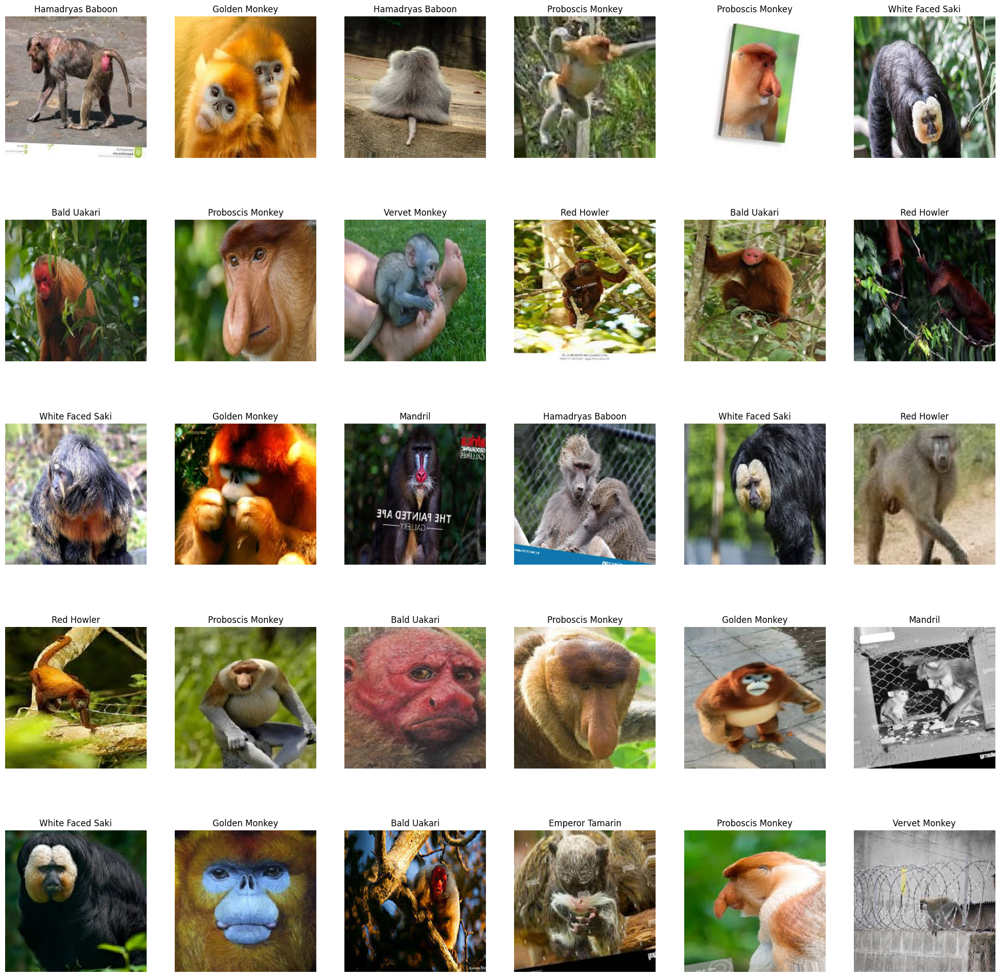

In [ ]:
show_images(data=train_ds)

In [9]:
# Model URL
model_url = "https://tfhub.dev/google/bit/m-r50x1/1"

# Load From HUB
bit = hub.KerasLayer(model_url)

In [10]:
# Model Architecture
model_name = "BiT-Monkey-Species"
model = Sequential([
    bit,
    Dense(n_classes, activation='softmax', kernel_initializer='zeros')
], name=model_name)

In [11]:
# Optimizer & LR Scheduler
learning_rate = 1e-3
SCHEDULE_BOUNDARIES = [
    200,
    300,
    400,
]  # more the dataset size the schedule length increase

In [12]:
lr_scheduler = PiecewiseConstantDecay(
    boundaries=SCHEDULE_BOUNDARIES,
    values=[
        learning_rate,
        learning_rate*0.1,
        learning_rate*0.01,
        learning_rate*0.001,
    ]
)

In [13]:
opt = SGD(learning_rate=lr_scheduler, momentum=0.9)

In [14]:
# Compile Model
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=opt,
    metrics=[
        keras.metrics.SparseCategoricalAccuracy(name="Accuracy"),
        keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="Top3Acc")
    ]
)

In [15]:
# Callbacks
cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(model_name + ".h5", save_best_only=True)]

In [16]:
# Train Model
history = model.fit(train_ds, validation_data=valid_ds, epochs=3, callbacks=cbs)

Epoch 1/3
282/282 [==============================] - ETA: 0s - loss: 0.4087 - Accuracy: 0.8916 - Top3Acc: 0.9670 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



282/282 [==============================] - 5960s 21s/step - loss: 0.4087 - Accuracy: 0.8916 - Top3Acc: 0.9670 - val_loss: 0.2103 - val_Accuracy: 0.9441 - val_Top3Acc: 0.9790
Epoch 2/3
282/282 [==============================] - 4621s 16s/step - loss: 0.1845 - Accuracy: 0.9550 - Top3Acc: 0.9899 - val_loss: 0.1969 - val_Accuracy: 0.9441 - val_Top3Acc: 0.9810
Epoch 3/3
282/282 [==============================] - 4759s 17s/step - loss: 0.1799 - Accuracy: 0.9560 - Top3Acc: 0.9897 - val_loss: 0.2015 - val_Accuracy: 0.9421 - val_Top3Acc: 0.9840


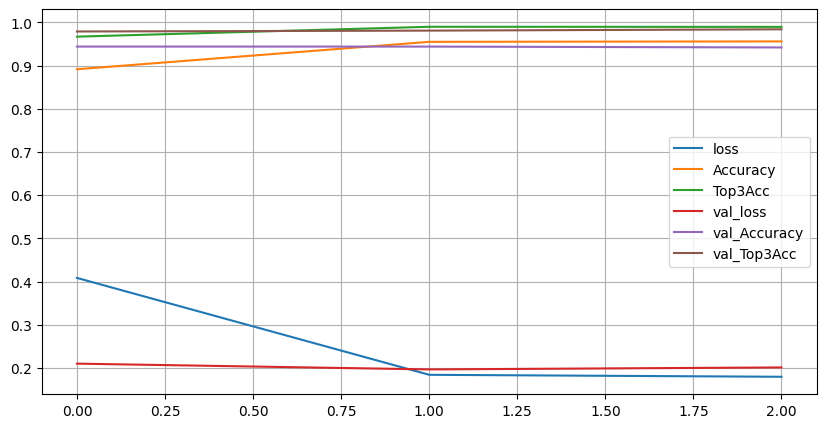

In [17]:
pd.DataFrame(history.history).plot(figsize=(10,5))
plt.grid()
plt.show()

In [18]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/BiT-Monkey-Species.h5/BiT-Monkey-Species.h5", custom_objects={"KerasLayer":bit})

In [21]:
model_resnet = load_model("/content/drive/MyDrive/Colab Notebooks/Monkey_Species_Data/resnet50V2-v1.h5", custom_objects={"KerasLayer":bit})

In [19]:
model.evaluate(test_ds)

41/41 [==============================] - 741s 18s/step - loss: 0.2601 - Accuracy: 0.9349 - Top3Acc: 0.9816


[0.2600869834423065, 0.9349157810211182, 0.9816232919692993]

In [22]:
model_resnet.evaluate(test_ds)

41/41 [==============================] - 312s 8s/step - loss: 0.3175 - accuracy: 0.9188


[0.3175162374973297, 0.9188361167907715]

1/1 [==============================] - 0s 430ms/step


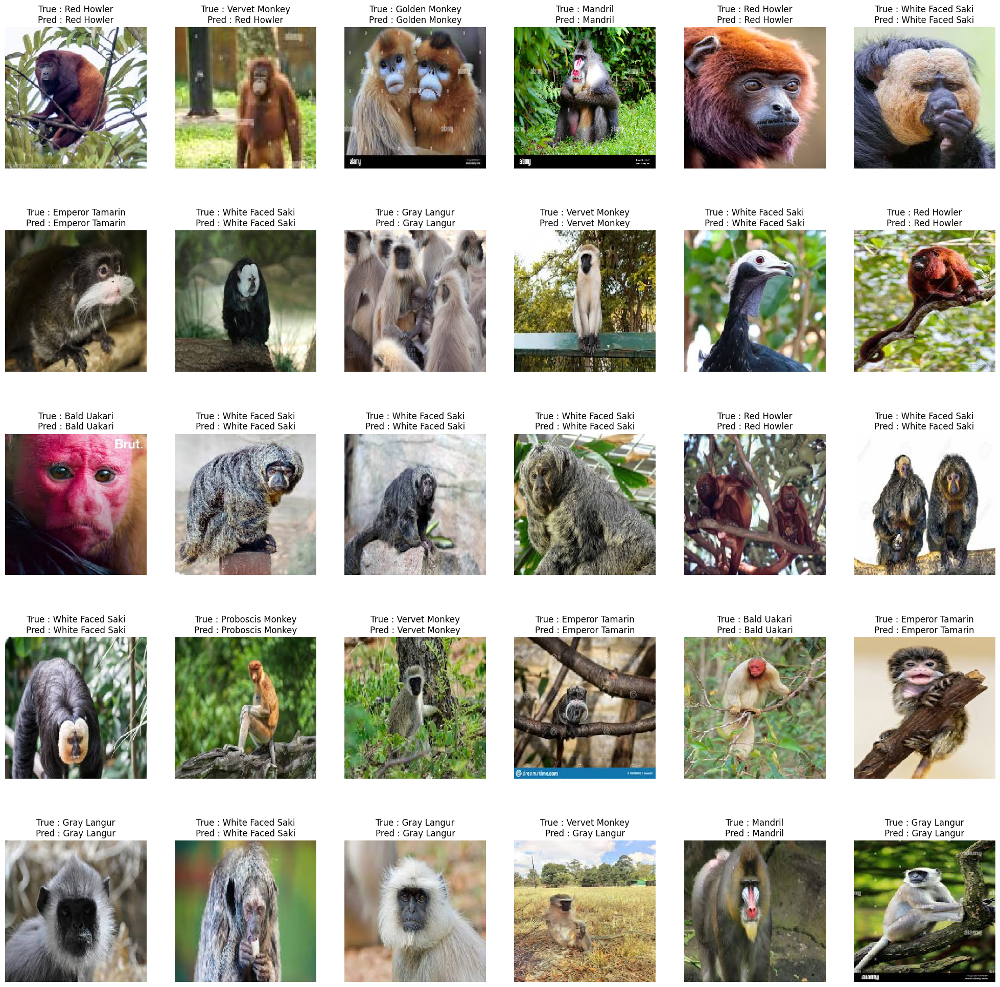

In [20]:
show_images(data=test_ds, model=model)

1/1 [==============================] - 0s 207ms/step


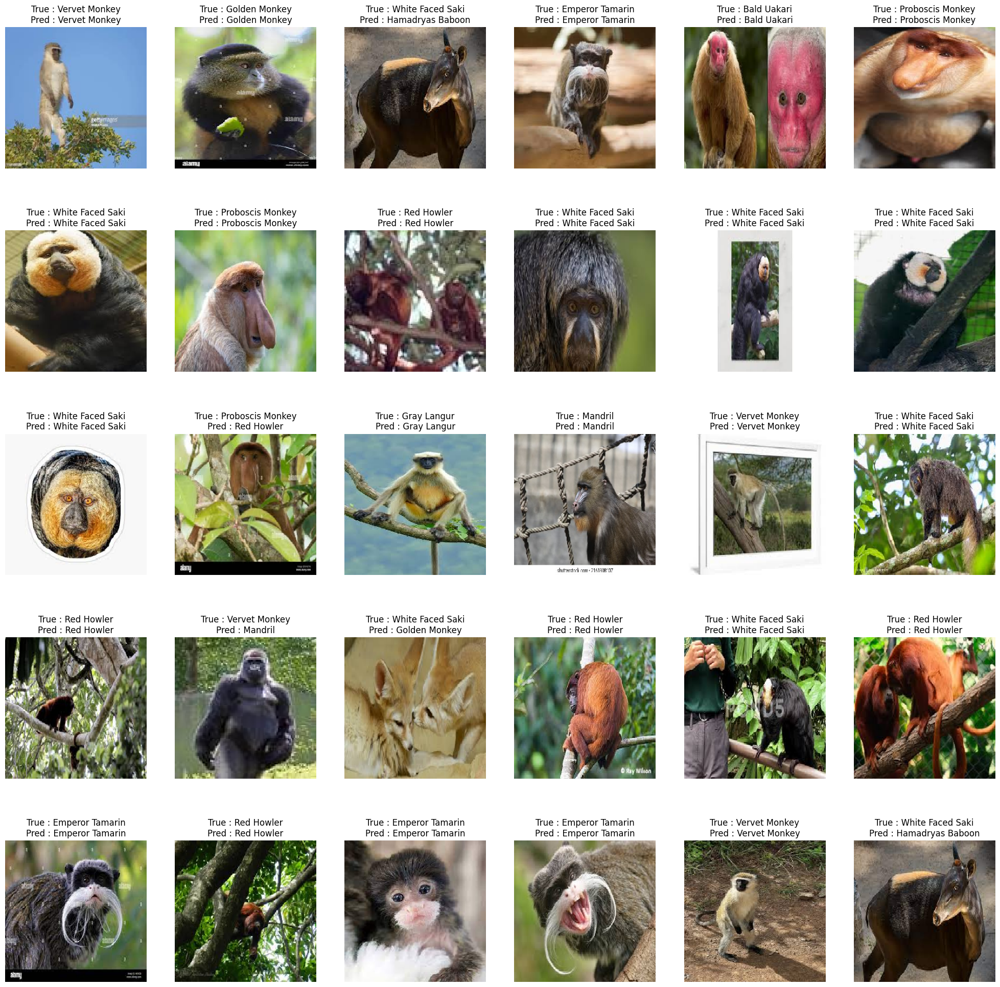

In [23]:
show_images(data=test_ds, model=model_resnet)